## This file is supposed to be run on your own device - simply if you want to get an idea of how the OpenCV Library and its features work

In [180]:
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np

# Plot image in Jupyter (instead of cv.imshow)
def PlotImage(OpenCV_BGR_Image, title="Image"):
    """
    Displays an OpenCV BGR image inline using Matplotlib.
    Shows shape in the title.
    """
    RGB_Image = cv.cvtColor(OpenCV_BGR_Image, cv.COLOR_BGR2RGB)
    plt.imshow(RGB_Image)

    ls = list(RGB_Image.shape)
    if len(ls) > 2:
        ls.remove(ls[-1])

    plt.title(f"{title} - {ls}")
    plt.axis("off")
    plt.show()

# Get image dimensions
def get_image_dimensions(image):
    """
    Returns (height, width) of the image and prints them.
    """
    height, width = image.shape[:2]
    print(f"Height: {height}, Width: {width}")
    return height, width


### Reading Images

In [2]:
Image=cv.imread('Lizard_img.jpg')

In [3]:
cv.imshow('Lizard',Image)
cv.waitKey(0)         

#Notes
#waitkey must be typed to ensure file closes properly, without it the kernel will crash!

-1

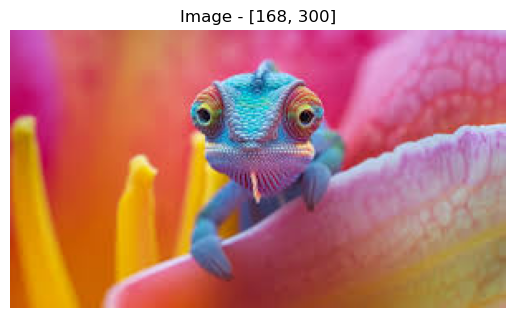

In [181]:
PlotImage(Image)

### Capturing Video

In [ ]:
vid=cv.VideoCapture(0)

while True:
    isTrue,frame = vid.read()          #Read frame as long there is one to read
    cv.imshow('Webcam feed',frame)    #Show the read frame, and The name of the tab is in ''
    
    if cv.waitKey(20) & 0xFF==ord('q'):  #assign keybind to a key of choice to stop executing video
        break

vid.release()
cv.destroyAllWindows()                #These 2 lines ensure video doesnt shutdown abruptly

#Notes
# IN case you get 215 Assertion error it means video is done executing and cannot find anymore frames to process

### Rescaling Images and per frame in a video

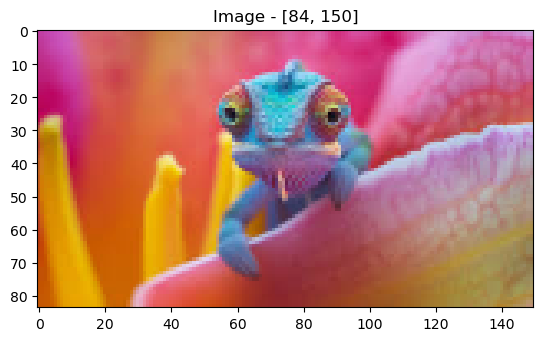

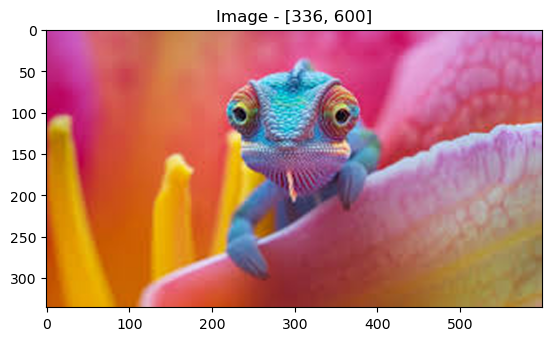

-1

In [14]:
def RescaleFrame(frame,scale=0.75):
    height=int(frame.shape[0]*scale)    #shape[0] is used for height/length
    width=int(frame.shape[1]*scale)     #shape[1] is used for width
    dimensions=(width,height)

    if scale<=1:
        return cv.resize(frame,dimensions,interpolation=cv.INTER_AREA)   ##Best suited for shrinking Ops

    if scale>1:
        return cv.resize(frame,dimensions,interpolation=cv.INTER_CUBIC)  ##Best suited for enlarging Ops

PlotImage(RescaleFrame(Image,0.5))
PlotImage(RescaleFrame(Image,2))

cv.waitKey(0)

In [15]:
#Rescale on live vid

vid=cv.VideoCapture(0)
    
while True:
    isTrue,frame = vid.read()          #Read frame as long there is one to read
    frame=RescaleFrame(frame)
    cv.imshow('Webcam feed',frame)    #Show the read frame, and The name of the tab is in ''
    
    if cv.waitKey(20) & 0xFF==ord('q'):  #assign keybind to a key of choice to stop executing video
        break

vid.release()
cv.destroyAllWindows()

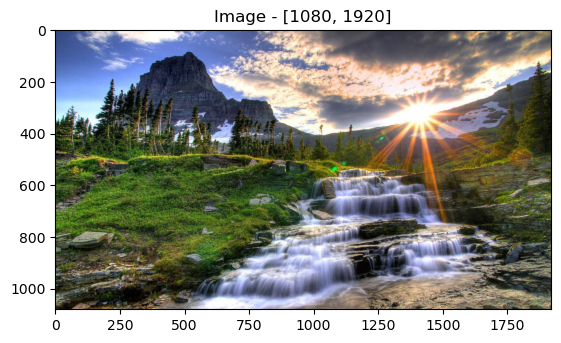

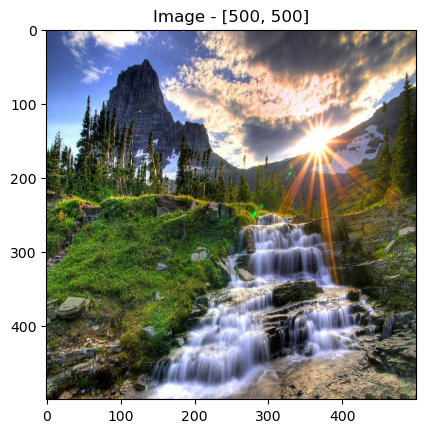

In [89]:
#Image Resizing using the cv.resize() function

#For resizing bigger to smaller
img=cv.imread('Scenery_img.jpg') #Original resolution is 1920x1080
img_small=cv.resize(img,(500,500))
PlotImage(img)
PlotImage(img_small)

#Notes
#For resizing smaller to bigger interpolation must be changed
#LINEAR_EXACT is faster than INTER_CUBIC but CUBIC giveth better quality

### Drawing Shapes and Putting Text

In [16]:
import numpy as np

In [17]:
blank=np.zeros((500,500,3),dtype='uint8') #500 height, 500 width, 3 being shape of color channels

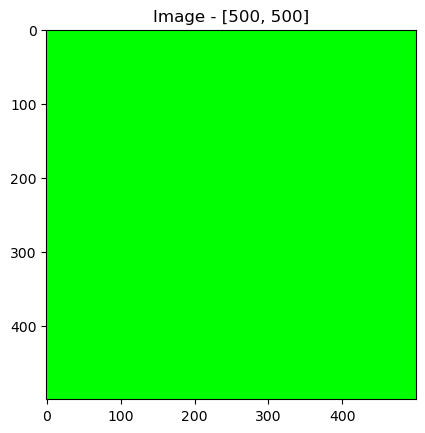

In [18]:
blank[:]=0,255,0
PlotImage(blank)

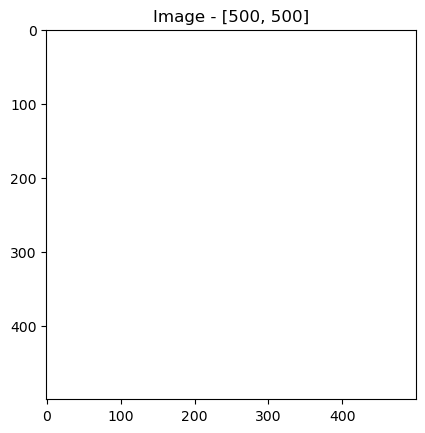

In [24]:
blank[:]=255,255,255
PlotImage(blank)

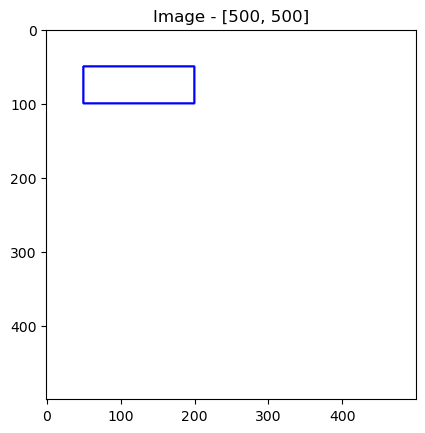

In [25]:
#Drawing a rectangle

cv.rectangle(blank,(50,50),(200,100),(255,0,0),thickness=2)  #(image,pt1,pt2,color,thickness)
PlotImage(blank)

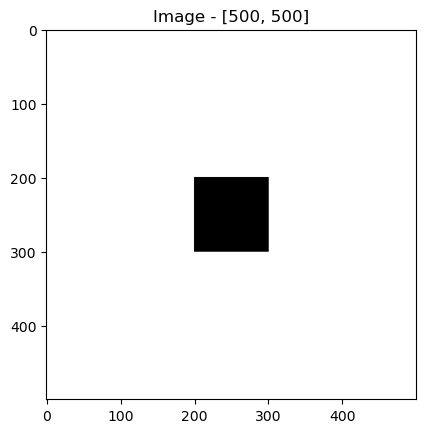

In [26]:
#Filling a rectangle

blank[:]=255,255,255 #Set blank to white color (BGR Color scheme)
cv.rectangle(blank,(200,300),(300,200),(0,0,0),thickness=cv.FILLED)
PlotImage(blank)

Enter board size 10


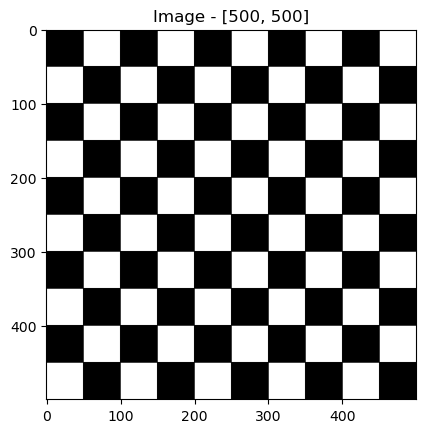

In [171]:
#Side quest: make chessboard pattern
size=500
blank=np.zeros((size,size,3),dtype='uint8')
blank[:]= 255,255,255

boardsize = int(input("Enter board size"))
for i in range (0,boardsize):
    for j in range(0,boardsize):
        if((i+j)%2==0):
            cv.rectangle(blank,(i*(size//boardsize),j*(size//boardsize)),((i+1)*(size//boardsize),(j+1)*(size//boardsize)),(0,0,0),thickness=-1)

PlotImage(blank)


In [38]:
blank[:]=255,255,255

In [18]:
#Circle

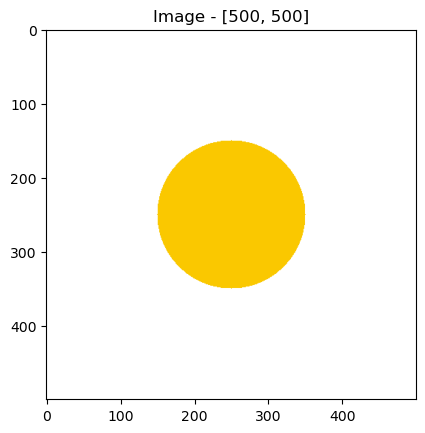

In [50]:
blank = cv.circle(blank,(250,250),100,(0,200,250),thickness=-1)
PlotImage(blank)

### Text

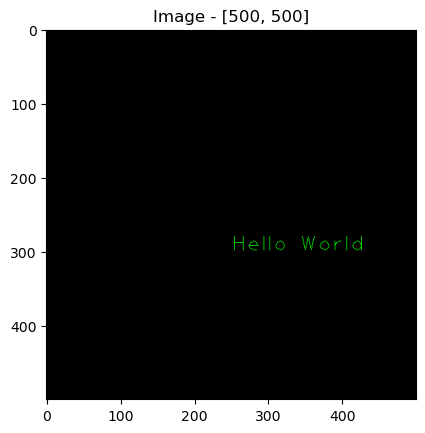

In [55]:
blank = cv.putText(blank,'Hello World',(250,300),cv.FONT_HERSHEY_PLAIN,2,(0,255,0),1)
PlotImage(blank)

blank[:]=0,0,0 #Testing multiple origin positions and this line of code resets the image back to black before testing

### Some important functions

Image before grayscale


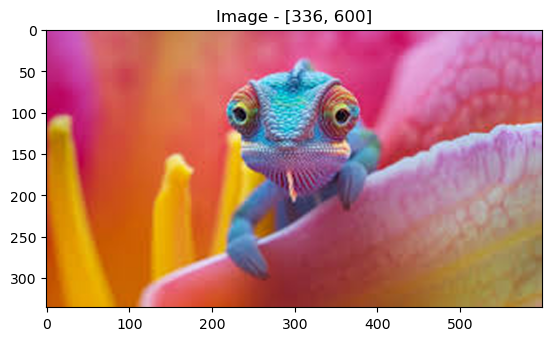



Image after GrayScale


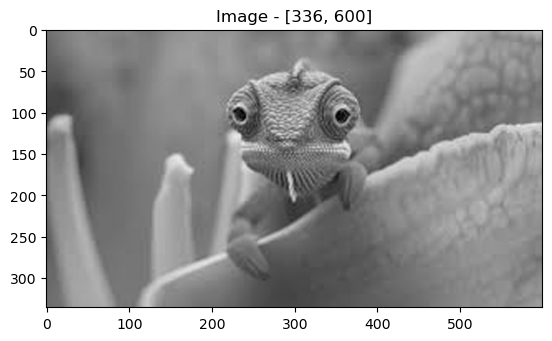

In [59]:
#Gray Scaler: Enables only to see intensity distribution of the image rather than colors

img=cv.imread('Lizard_img.jpg')

print('Image before grayscale')
PlotImage(Img_B)

Gray_Img_B=cv.cvtColor(Img_B,cv.COLOR_BGR2GRAY)
print("\n\nImage after GrayScale")
PlotImage(Gray_Img_B)

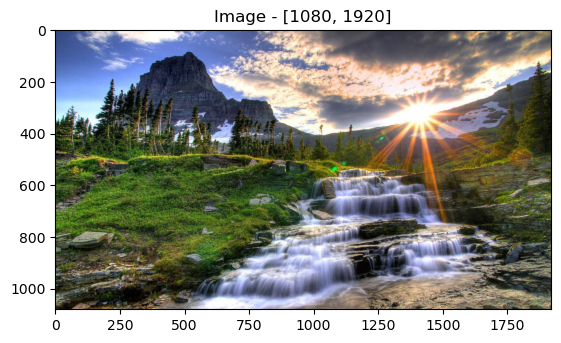

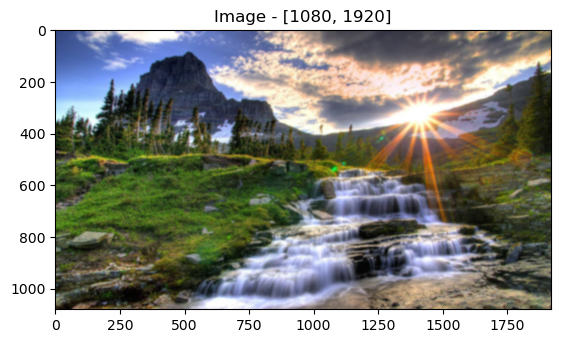

In [76]:
#Gaussian Blur

SceneryImageOriginal=cv.imread('Scenery_img.jpg')
PlotImage(SceneryImageOriginal)

BlurredScenery=cv.GaussianBlur(SceneryImageOriginal,(9,9),cv.BORDER_DEFAULT) 
#here (501,501) is kernel size and it is the kernel window size system takes for processing
#Increasing k_size will increase in the visible blur within the image, always take ksize as odd!!!

PlotImage(BlurredScenery)

Original Image


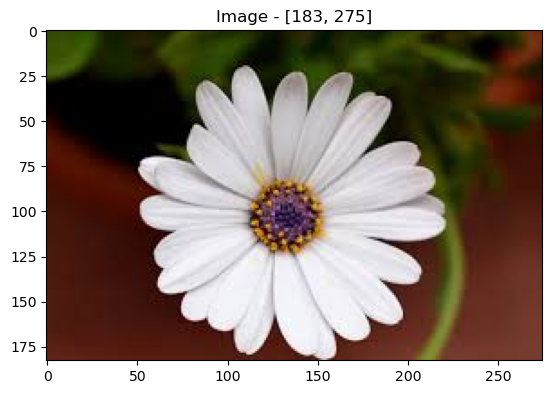

Lets see how different Kernel Sizes affect Edge detection
Kernel size (1,1)


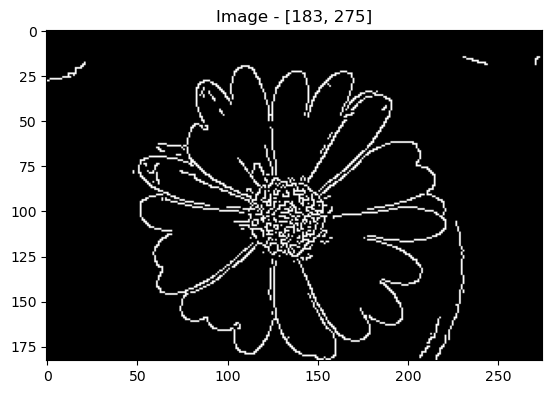

Kernel size (3,3)


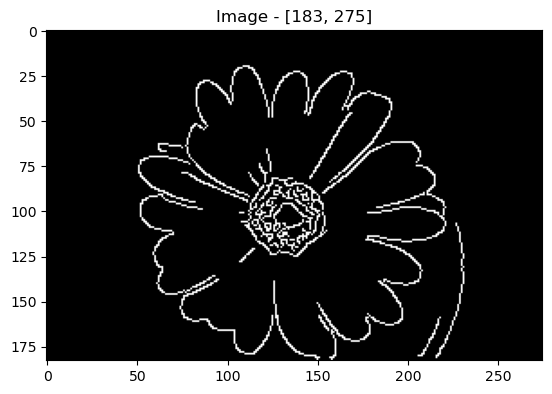

Kernel size (5,5)


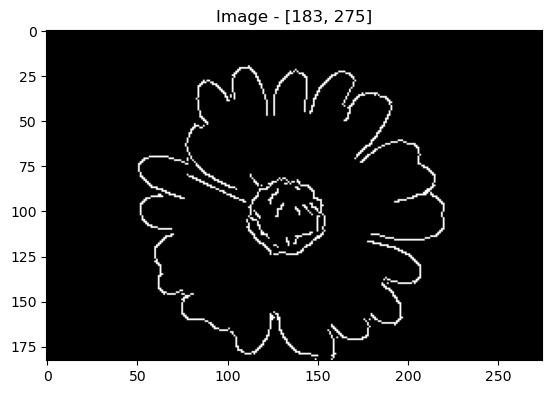

Kernel size (7,7)


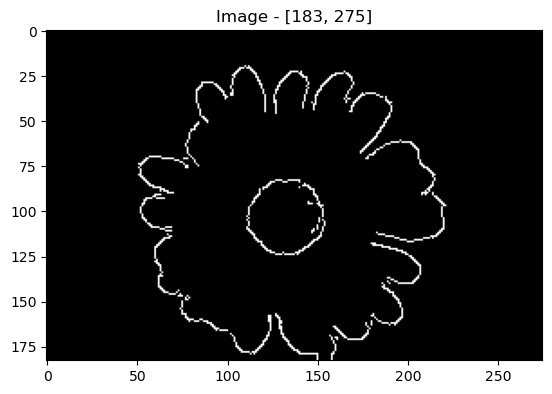

Kernel size (9,9)


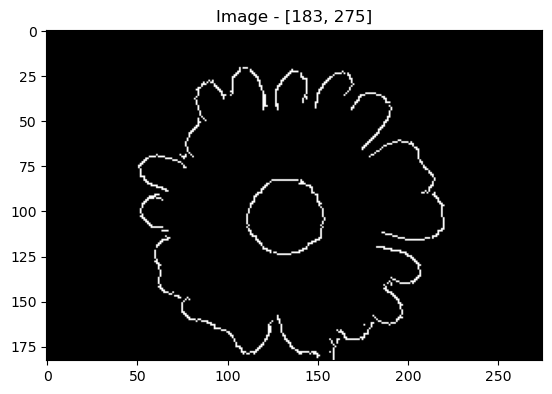

Kernel size (11,11)


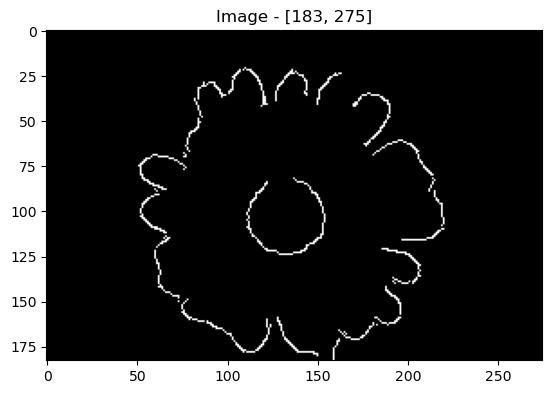

In [81]:
#Edge Cascade
#Edge Detection , using Canny for this case, albeit there are multiple other available notably, Haar Cascades and others
#For detecting lesser edges of more significant objects, use blur

Edge = cv.imread('Edge Detection_img.jpg')
print('Original Image')
PlotImage(Edge)

print('Lets see how different Kernel Sizes affect Edge detection')

for i in range(1,12,2):
    print(f'Kernel size ({i},{i})')
    EdgedImg=cv.Canny(cv.GaussianBlur(Edge,(i,i),cv.BORDER_DEFAULT),125,175) #Canny Function called ,with 125 and 175 being threshold values
    PlotImage(EdgedImg)

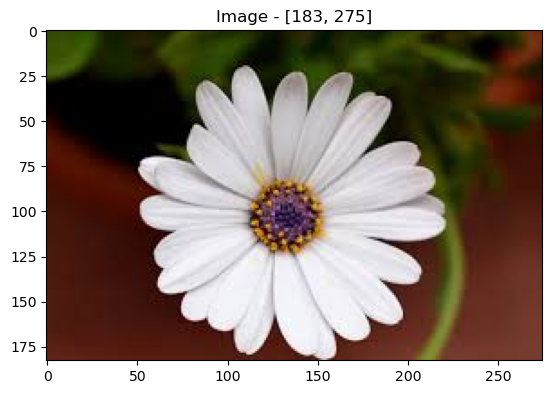

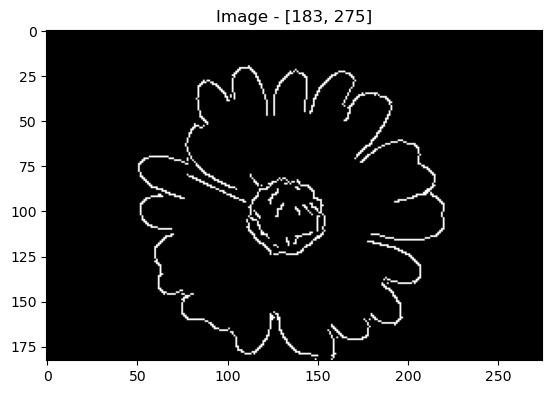

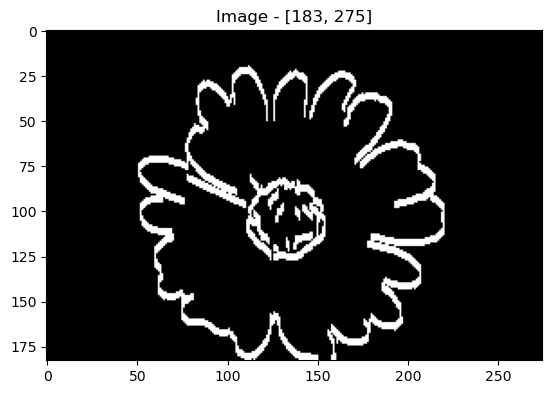

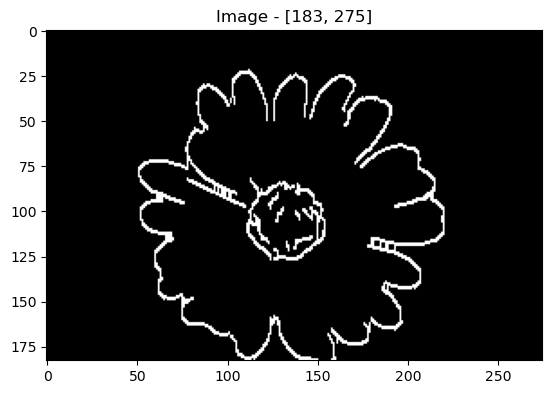

In [86]:
Edge = cv.imread("Edge Detection_img.jpg")
PlotImage(Edge)

# Step 1: Gaussian Blur + Canny Edge Detection
blurred = cv.GaussianBlur(Edge, (5,5), cv.BORDER_DEFAULT)
EdgedImg = cv.Canny(blurred, 125, 175)
PlotImage(EdgedImg)

# Step 2: Dilation (thickens edges)
#Notes: Dilation is an operation that expands the white (foreground) regions in a binary image, i.e -
# White regions grow/thicken, Small holes in objects get filled, Edges become more connected.
dilated = cv.dilate(EdgedImg, (3,3), iterations=3)
PlotImage(dilated)

# Step 3: Erosion (thins edges)
#Notes: Erosion is the opposite of dilation. It shrinks the white regions in a binary image.
# White regions shrink/thin, Small noise dots disappear, Breaks apart weakly connected objects.
eroded = cv.erode(dilated, (3,3), iterations=2)
PlotImage(eroded)


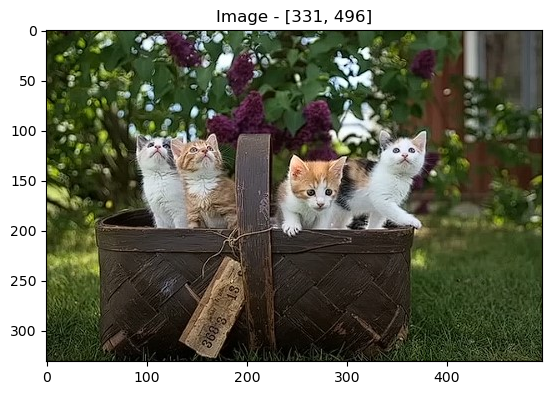

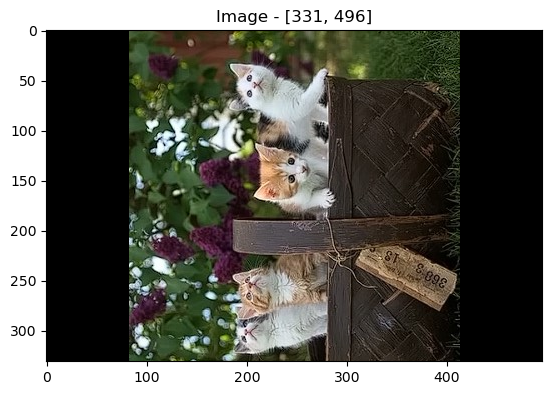

In [172]:
# Image rotation
CatImg = cv.imread('cat_img.jpg')

def rotate(img,angle,Rotpoint=None):
    height,width=img.shape[:2]
    
    if Rotpoint is None:
        Rotpoint=(width//2,height//2)
        
    rotmat=cv.getRotationMatrix2D(Rotpoint,angle,1.0)
    dimensions=(width,height)
    
    return cv.warpAffine(img,rotmat,dimensions)

PlotImage(CatImg)
rotated_img=rotate(CatImg,90)
PlotImage(rotated_img)

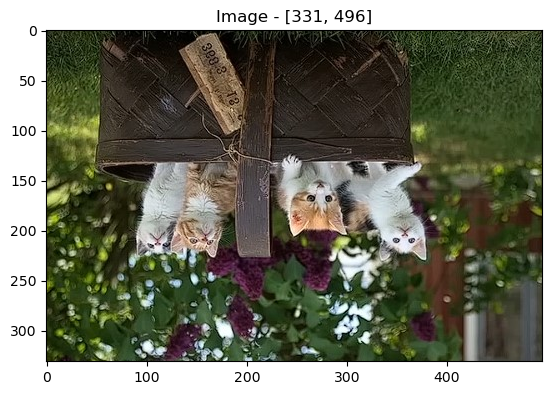

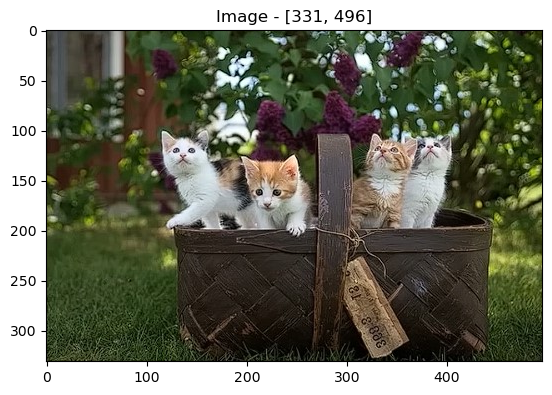

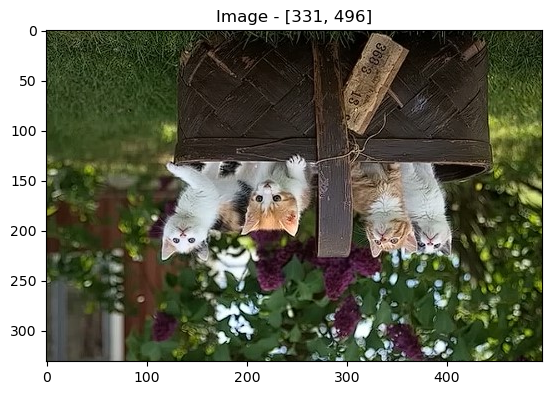

In [174]:
CatImg = cv.imread('cat_img.jpg')

# Image flipping 
flipped=cv.flip(CatImg,0)                # flip code 0 means vertical flipping
PlotImage(flipped)

flipped=cv.flip(CatImg,1)                # flip code 1 means horizontal flipping
PlotImage(flipped)

flipped=cv.flip(CatImg,-1)                # flip code -1 means flipping both vertically and horizontally
PlotImage(flipped)

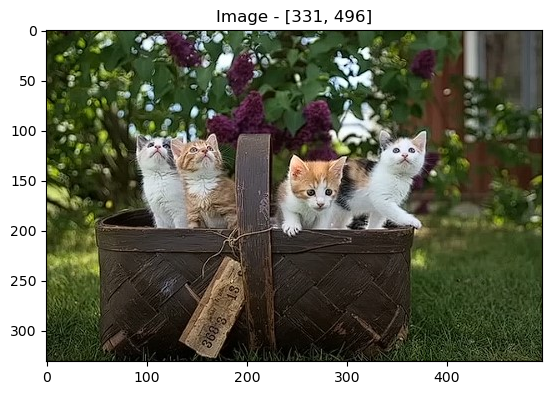

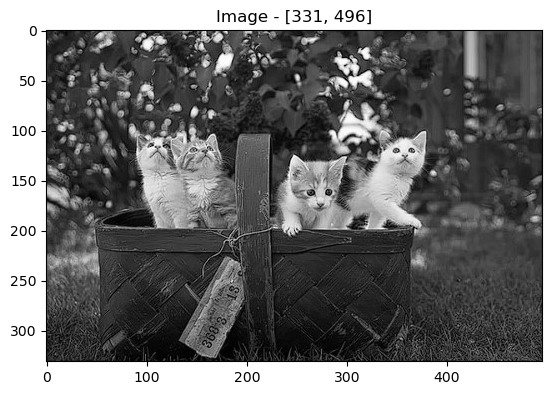

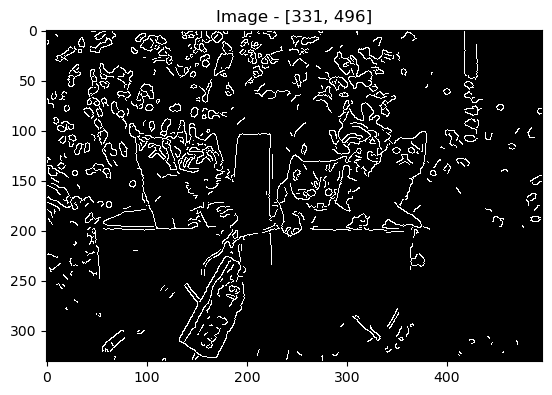

In [179]:
#Contour detection: Important for object identification

#Original
PlotImage(CatImg)

#Grayscale conversion
GrayImg=cv.cvtColor(CatImg,cv.COLOR_BGR2GRAY)
PlotImage(GrayImg)

canny=cv.Canny(cv.GaussianBlur(GrayImg,(3,3),cv.BORDER_DEFAULT),125,175)
PlotImage(canny)

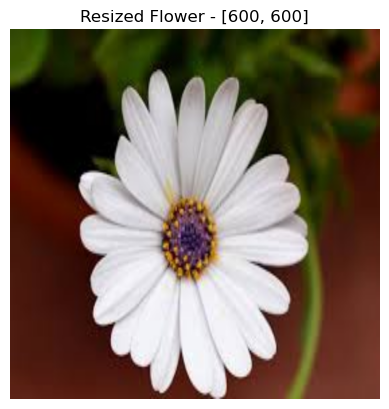

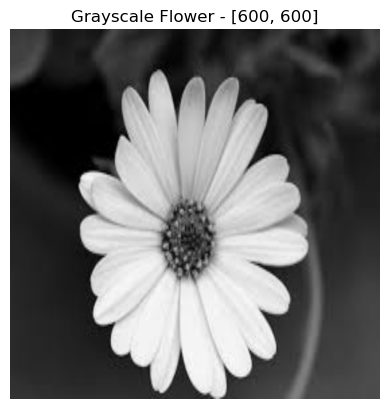

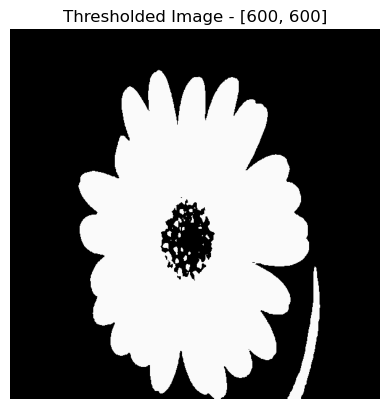

In [182]:
#There is an alternative to using the canny method aka 'threshold'
Flower = cv.imread("Edge Detection_img.jpg")
Flower_r = cv.resize(Flower, (600, 600))
PlotImage(Flower_r, "Resized Flower")

Flower_gray = cv.cvtColor(Flower_r, cv.COLOR_BGR2GRAY)
PlotImage(Flower_gray, "Grayscale Flower")

# Apply Thresholding
ret, thresh = cv.threshold(Flower_gray, 100, 250, cv.THRESH_BINARY)
PlotImage(thresh, "Thresholded Image")


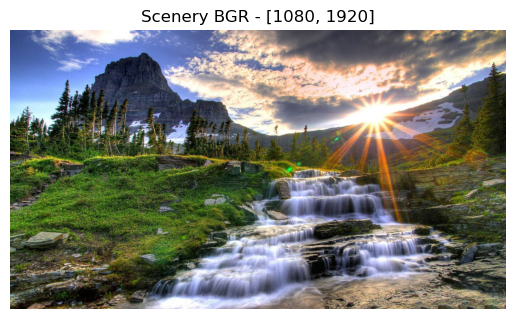

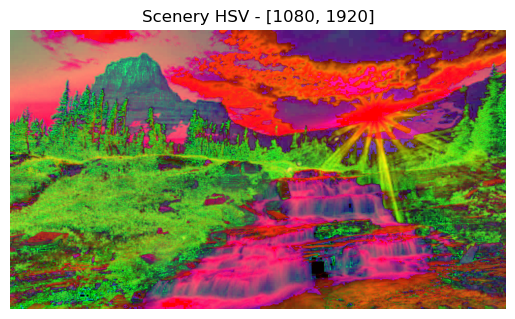

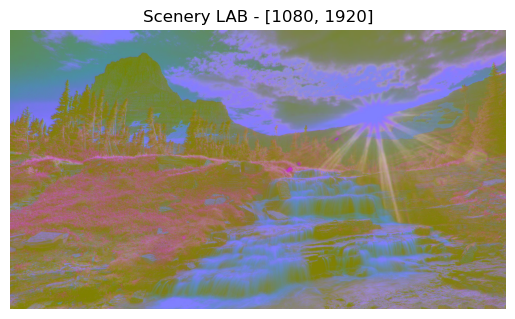

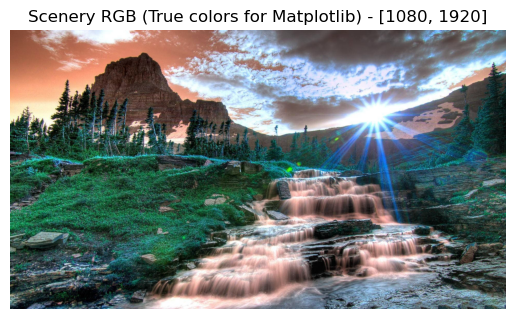

In [183]:
### Color Spaces

sceneryBGR = cv.imread("Scenery_img.jpg")
PlotImage(sceneryBGR, "Scenery BGR")

sceneryHSV = cv.cvtColor(sceneryBGR, cv.COLOR_BGR2HSV)
PlotImage(sceneryHSV, "Scenery HSV")

sceneryLAB = cv.cvtColor(sceneryBGR, cv.COLOR_BGR2LAB)
PlotImage(sceneryLAB, "Scenery LAB")

sceneryRGB = cv.cvtColor(sceneryBGR, cv.COLOR_BGR2RGB)
PlotImage(sceneryRGB, "Scenery RGB (True colors for Matplotlib)")

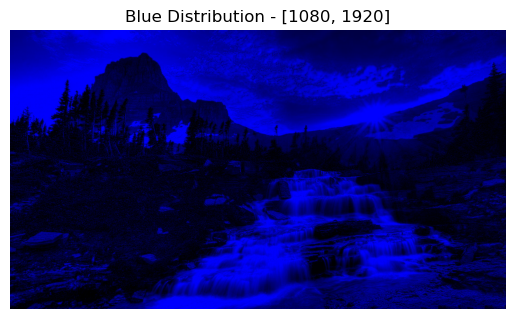

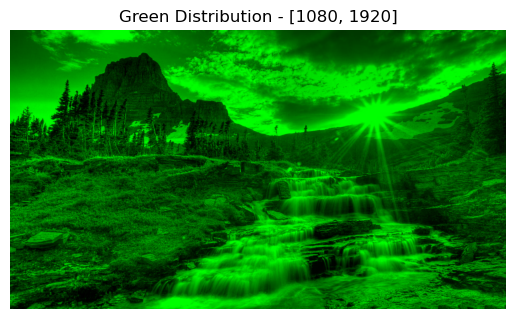

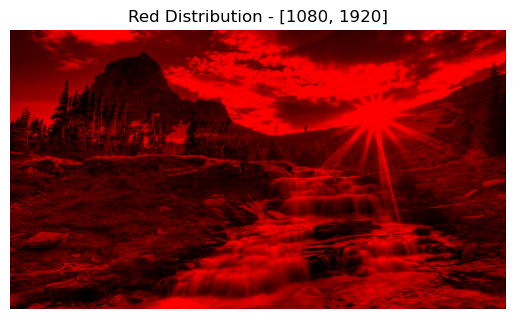

Image Shape: (1080, 1920, 3)
Blue Shape: (1080, 1920)
Green Shape: (1080, 1920)
Red Shape: (1080, 1920)


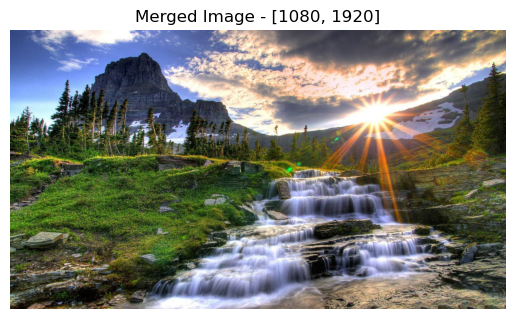

In [187]:
##Color Channels

img = cv.imread("Scenery_img.jpg")

b, g, r = cv.split(img)
blank = np.zeros(img.shape[:2], dtype="uint8")

blue = cv.merge([b, blank, blank])
green = cv.merge([blank, g, blank])
red = cv.merge([blank, blank, r])

PlotImage(blue, "Blue Distribution")
PlotImage(green, "Green Distribution")
PlotImage(red, "Red Distribution")

print("Image Shape:", img.shape)
print("Blue Shape:", b.shape)   ##in this image darker spots for blue would mean blue's concentration in those areas isnt high
print("Green Shape:", g.shape)
print("Red Shape:", r.shape)

merged = cv.merge([b, g, r])
PlotImage(merged, "Merged Image")

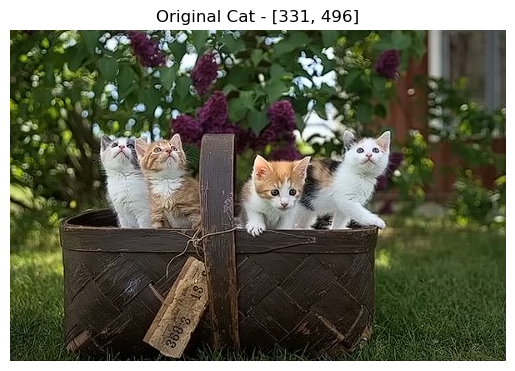

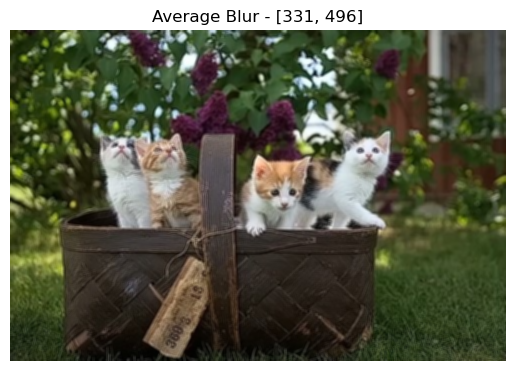

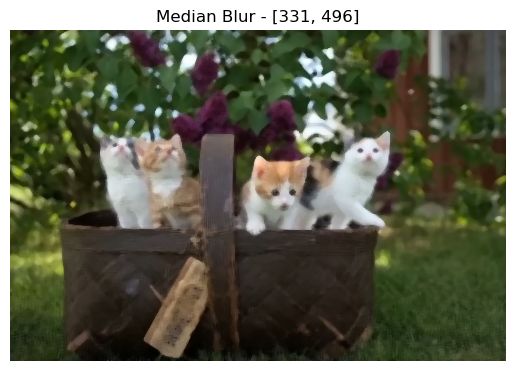

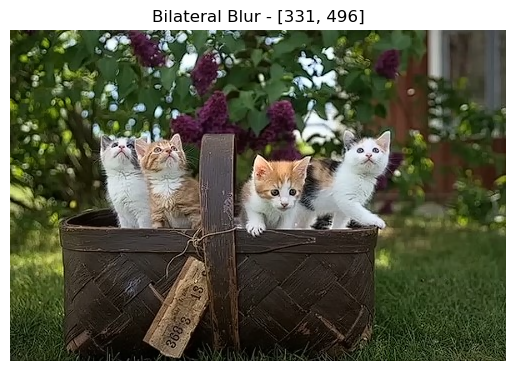

In [190]:
##Smoothing and Blurring

catimg = cv.imread("cat_img.jpg")
PlotImage(catimg, "Original Cat")

#Averaging is a method of blurring 
average_blur = cv.blur(catimg, (3, 3))
PlotImage(average_blur, "Average Blur")

# Median Blur
median_blur = cv.medianBlur(catimg, 5)
PlotImage(median_blur, "Median Blur")

#Bilateral Blurring: Important for advanced CV Projects, retains edges
bilateral_blur=cv.bilateralFilter(catimg,3,15,15)
#Sigmacolor : Larger values means more colors in neighbourhood to be considered when the blur is to be calculated
#Sigmaspace : Pixels further out from the center will influence blurring
PlotImage(bilateral_blur, "Bilateral Blur")

#Gaussian method does not blur like average, instead assigns weights and averages, thus more natural than other methods
#But due to its specific method, it is more preferred in CV projects to remove salt/pepper noise

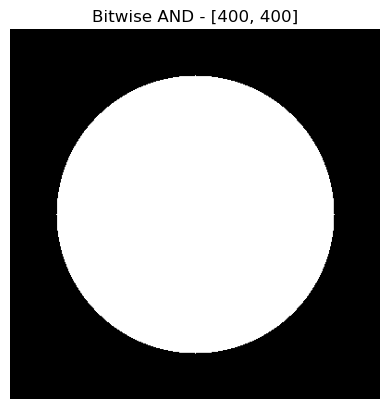

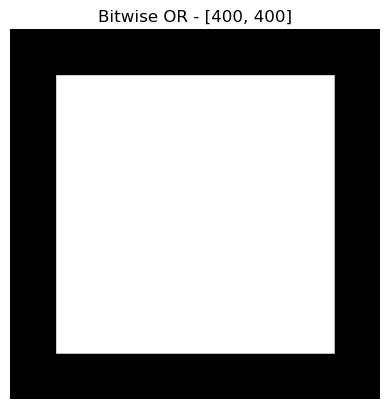

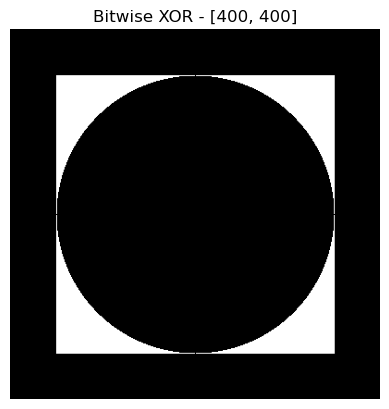

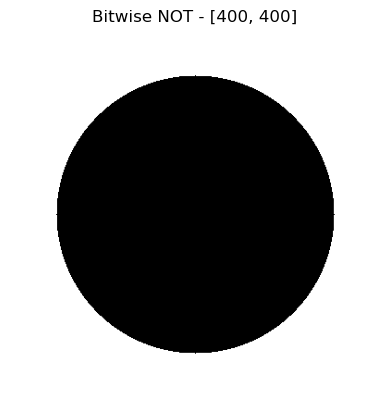

In [194]:
##Bit wise ops, you can apply the usual OPS you use on variables on images , like AND OR XOR NOT

blank1 = np.zeros((400, 400), dtype="uint8")
blank2 = np.zeros((400, 400), dtype="uint8")

circle = cv.circle(blank1.copy(), (200, 200), 150, 255, -1)
rectangle = cv.rectangle(blank2.copy(), (50, 50), (350, 350), 255, -1)

bitwise_and = cv.bitwise_and(circle, rectangle)
bitwise_or = cv.bitwise_or(circle, rectangle)
bitwise_xor = cv.bitwise_xor(circle, rectangle)
bitwise_not = cv.bitwise_not(circle)

PlotImage(cv.merge([bitwise_and]*3), "Bitwise AND")
PlotImage(cv.merge([bitwise_or]*3), "Bitwise OR")
PlotImage(cv.merge([bitwise_xor]*3), "Bitwise XOR")
PlotImage(cv.merge([bitwise_not]*3), "Bitwise NOT")


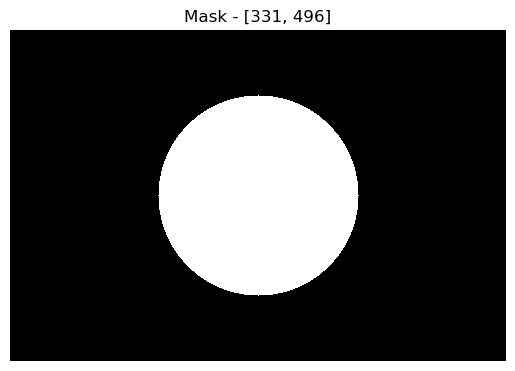

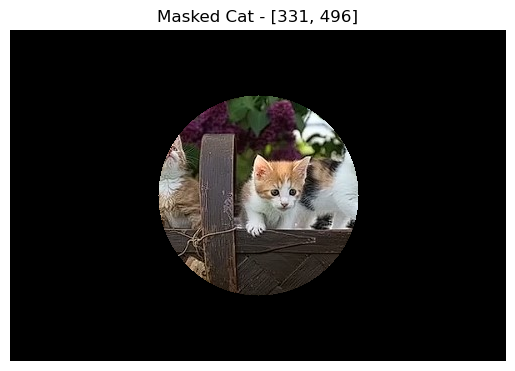

In [195]:
##Masking helps us focus on the important parts of the image only

blank = np.zeros(catimg.shape[:2], dtype="uint8")
mask = cv.circle(blank, (catimg.shape[1]//2, catimg.shape[0]//2), 100, 255, thickness=-1)
PlotImage(mask, "Mask")

masked_img = cv.bitwise_and(catimg, catimg, mask=mask)
PlotImage(masked_img, "Masked Cat")
